# Load post-processed monte carlo output data and setup the training/test data

## Setup

In [2]:
# Set local path
import sys
sys.path.append('random_forest')
sys.path.append('utils')


# Imports
import pandas as pd
import numpy as np
# import scipy.io as spio
from os.path import join
from math import ceil

import pprint
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
# from sklearn.preprocessing import minmax_scale
# from sklearn.neighbors import NearestNeighbors
# from scipy.spatial import KDTree
import seaborn as sns
import matplotlib.pyplot as plt

import hydroplume_emulator.rf_training_funcs as rft
from hydroplume_emulator.config import DATA_DIR
from hydroplume_emulator.mat_tools import matfile_struct_to_dict as mat2dict
from hydroplume_emulator.mat_tools import extrapVentRadius

In [3]:
# ---- Directories and files ----

monte_carlo_fixed_vars_file = join(DATA_DIR, 'KatlaHydro_v8_noLd_2024-06-30_N20000_fixed_MC_vars.mat')  # Simulation, fixed input parameters
monte_carlo_rand_vars_file  = join(DATA_DIR, 'KatlaHydro_v8_noLd_2024-06-30_N20000_rand_MC_vars.parquet') # Simulation, randomized input parameters
 # I/O data table for main parameters of interest, water depths up to 360 m
monte_carlo_data_file_20k   = join(DATA_DIR, 'KatlaHydro_v8_noLd_2024-06-30_N20000.parquet') 
 # data table for main parameters, scaled/non-dimensionalized
monte_carlo_scaled_file     = join(DATA_DIR, 'KatlaHydro_v8_noLd_2024-06-30_N20000_scaled.parquet')
# Smaller test data set with water depths up to 500 m for testing
monte_carlo_data_file_10k   = join(DATA_DIR, 'KatlaHydro_v8_noLd_2024-06-22_N10000.parquet') 
# Scaled test data set, mostly handy for validation and plotting
scaled_test_data_file       = join(DATA_DIR, 'KatlaHydro_v8_noLd_2024-06-22_N10000_scaled.parquet') 

# ---- DATA PARAMS ----
search_radius = 0.05

# ---- RF PARAMS ----
# Split siize
train_size = 0.2 # Small set for now
test_size  = 0.1

n_estimators = 200
max_depth    = 20
bootstrap    = True
oob_score    = True
n_jobs       = 4
max_samples  = 0.2
min_samples_split = 5
min_samples_leaf = 4
verbose = 1

# Grid search params
param_grid = {'n_estimators' : [100],
              'max_depth' :  [10, 20, 30,],
              # 'min_samples_split' : [5],
              'min_samples_leaf' : [2,4,8,16],
             }

# ----- Some handy switches----
train_all_vars = False

## Data exploration, QC, and preparation

In [4]:
# Load up data
monte_carlo_fixed_vars = mat2dict(monte_carlo_fixed_vars_file,'fixedVars')
monte_carlo_rand_vars  = pd.read_parquet(monte_carlo_rand_vars_file)
mc_df                  = pd.read_parquet(monte_carlo_data_file_20k)
mc_df_scaled           = pd.read_parquet(monte_carlo_scaled_file)
mc_df_10k             = pd.read_parquet(monte_carlo_data_file_10k)
mc_df_10k_scaled      = pd.read_parquet(scaled_test_data_file)

In [5]:
# Check data overview
print('\n---> 1st I/O data table:')
mc_df.info()
# print(mc_df.describe())

print('\n---> 2nd I/O data table:')
mc_df_10k.info()

print('\n---> SCALED 20k data table:')
mc_df_scaled.info()

print('\n---> SCALED 10k data table:')
mc_df_10k_scaled.info()


---> 1st I/O data table:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19999 entries, 0 to 19998
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   T               19999 non-null  float64
 1   Ze              19999 non-null  float64
 2   n_0             19999 non-null  float64
 3   n_ec            19999 non-null  float64
 4   Q               19999 non-null  float64
 5   conduit_radius  19999 non-null  float64
 6   D               19999 non-null  float64
 7   clps_regime     19999 non-null  float64
 8   hm              19999 non-null  float64
 9   qs0             19999 non-null  float64
 10  qsC             19999 non-null  float64
 11  rC              19999 non-null  float64
 12  qw0             19999 non-null  float64
 13  qwC             19999 non-null  float64
dtypes: float64(14)
memory usage: 2.1 MB

---> 2nd I/O data table:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Dat

In [6]:
# ----- Some data prep and labeling -------
# Build some labels for later use
input_vars = ['Ze','logQ'] #,'n_total','a_over_Rv','T'] # monte_carlo_rand_vars['Variable']
scaled_input_vars = ['Ze_over_Rv','logQ']

output_vars = ['hm','rC','qw0','qwC','qs0','qsC']
scaled_output_vars = ['hm_over_Q14','rC_over_Rv','qw0_over_Q','qwC_over_Q','qs0_over_Q','qsC_over_Q']


# Fill some nans in the second set that weren't previously dealt with
mc_df_10k['hm'] = mc_df_10k['hm'].fillna(0.)

mc_df = pd.concat([mc_df, mc_df_10k],axis=0,ignore_index=True)
mc_df_scaled = pd.concat([mc_df_scaled, mc_df_10k_scaled],axis=0,ignore_index=True)

# Will use the log for training and testing
mc_df['logQ'] =  np.log10(mc_df['Q'])
# mc_df_test['logQ'] = np.log10(mc_df_test['Q'])

mc_df.info()




<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29999 entries, 0 to 29998
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   T               29999 non-null  float64
 1   Ze              29999 non-null  float64
 2   n_0             29999 non-null  float64
 3   n_ec            29999 non-null  float64
 4   Q               29999 non-null  float64
 5   conduit_radius  29999 non-null  float64
 6   D               29999 non-null  float64
 7   clps_regime     29999 non-null  float64
 8   hm              29999 non-null  float64
 9   qs0             29999 non-null  float64
 10  qsC             29999 non-null  float64
 11  rC              29999 non-null  float64
 12  qw0             29999 non-null  float64
 13  qwC             29999 non-null  float64
 14  logQ            29999 non-null  float64
dtypes: float64(15)
memory usage: 3.4 MB


In [7]:
# Set of SCALED 2D coordinate points and averaged point clouds for comparison
Ze_range_train = (0, 360)  # Water depth range in second data set
Ze_range = (0, 500)  # Water depth range in complete set
Q_range  = (6, 8)    # LogQ range in training set

# Re-scaled data points between 0 and 1 for point queries 
ze_scaled = rft.scale_to_range(mc_df['Ze'], Ze_range )
logQ_scaled = rft.scale_to_range(mc_df['logQ'], Q_range)
coordinate_points = np.column_stack((ze_scaled,logQ_scaled))
data_points = mc_df[output_vars]

averaged_data_set = rft.get_averaged_point_cloud(mc_df[input_vars+output_vars],
                                                 coordinate_columns=['Ze','logQ'],
                                                 scale_ranges = {'Ze':Ze_range_train, 'logQ': Q_range},
                                                 radius = search_radius)

# Optionally run a SECOND time to get better smoothing
averaged_data_set_2x = rft.get_averaged_point_cloud(pd.concat([mc_df[input_vars], averaged_data_set],axis=1),
                                                 coordinate_columns=['Ze','logQ'],
                                                 scale_ranges = {'Ze':Ze_range_train, 'logQ': Q_range},
                                                 radius = search_radius)

# Get non-dimensionalized version
averaged_scaled_data = rft.apply_physical_data_scaling(averaged_data_set, mc_df['Q'])
averaged_2x_scaled_data = rft.apply_physical_data_scaling(averaged_data_set_2x, mc_df['Q'])



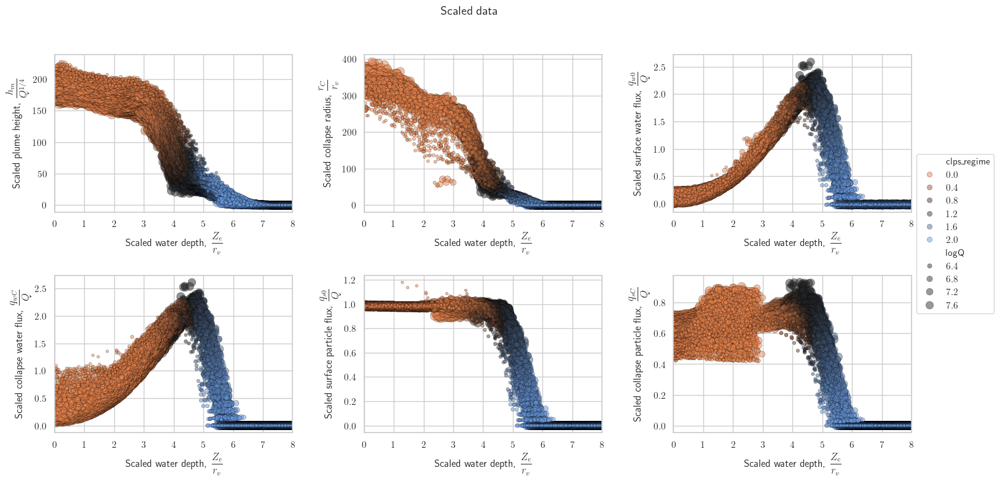

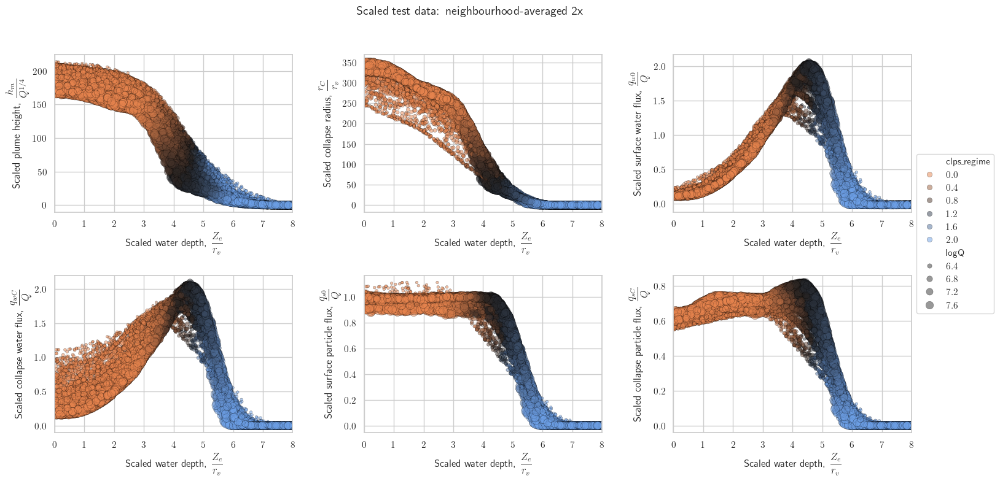

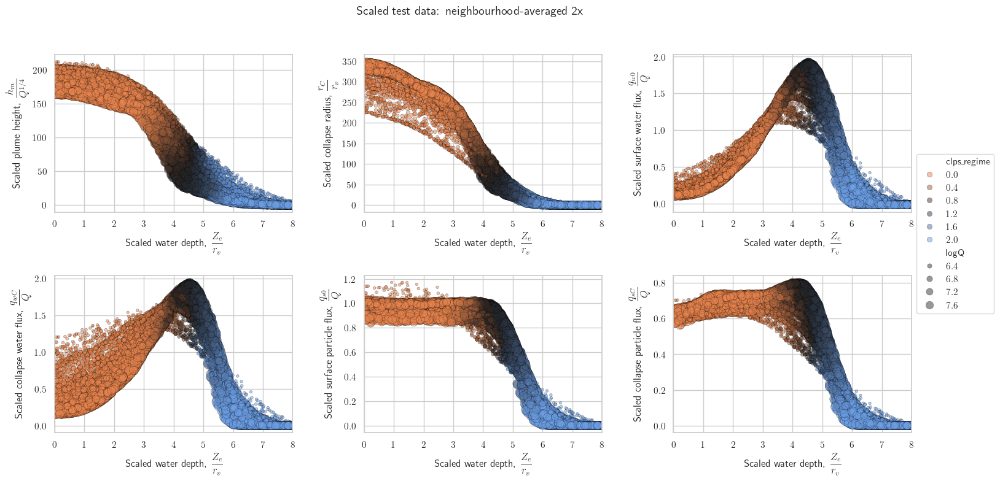

In [8]:
# Plot the scaled data set to better highlight physical relationships with water depth, Ze
%matplotlib inline
plt.rcParams['text.usetex'] = True



# ---- Make a few descriptive plots of the training dataset ----

fig,axes = rft.single_var_panels_scatter(
                           mc_df_scaled.sort_values('logQ',ascending=False),
                           x_var = 'Ze_over_Rv',
                           y_vars = scaled_output_vars,
                           hue_var = 'clps_regime',
                           size_var = 'logQ',
                           title = 'Scaled data',
                           xlim = (0., 8.)
                          )

fig,axes = rft.single_var_panels_scatter(pd.concat(
    [averaged_scaled_data,mc_df_scaled[scaled_input_vars+['clps_regime']]],axis=1),
                              # .sort_values('logQ',ascending=False),
                           x_var = 'Ze_over_Rv',
                           y_vars = scaled_output_vars,
                           hue_var = 'clps_regime',
                           size_var = 'logQ',
                           title = 'Scaled test data: neighbourhood-averaged',
                           xlim = (0., 8.)
                          )

fig,axes = rft.single_var_panels_scatter(pd.concat(
    [averaged_2x_scaled_data,mc_df_scaled[scaled_input_vars+['clps_regime']]],axis=1),
                              # .sort_values('logQ',ascending=False),
                           x_var = 'Ze_over_Rv',
                           y_vars = scaled_output_vars,
                           hue_var = 'clps_regime',
                           size_var = 'logQ',
                           title = 'Scaled test data: neighbourhood-averaged 2x',
                           xlim = (0., 8.)
                          )

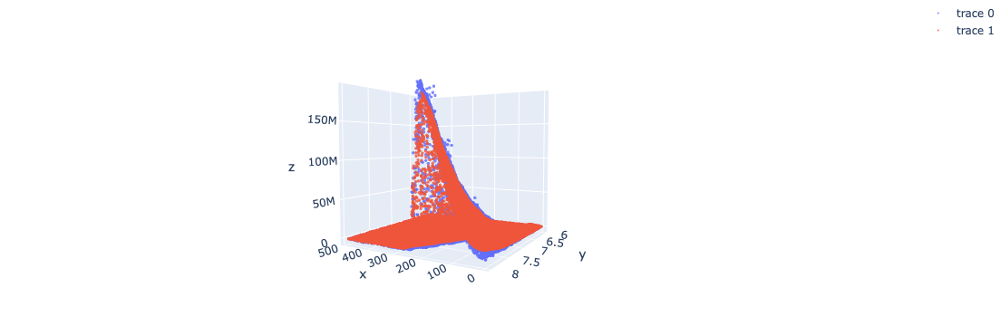

In [13]:
# Make an interactive 3d plot to visually verify the point-cloud averaging step

# # Import dependencies
# import plotly
# import plotly.graph_objs as go

# # Configure Plotly to be rendered inline in the notebook.
# plotly.offline.init_notebook_mode()

# # Configure the traces.
# trace = go.Scatter3d(
#     x=mc_df['Ze'],  y=mc_df['logQ'],  z=mc_df['qw0'], mode='markers',
#     marker={'size': 2, 'opacity': 0.8,})

# trace1 = go.Scatter3d(
#     x=mc_df['Ze'], y=mc_df['logQ'], z=averaged_data_set['qw0'], mode='markers',
#     marker={'size': 2,'opacity': 0.8,})

# # Configure the layout.
# layout = go.Layout(margin={'l': 0, 'r': 0, 'b': 0, 't': 0})

# data = [trace, trace1]

# plot_figure = go.Figure(data=data, layout=layout)

# # Render the plot.
# plotly.offline.iplot(plot_figure)

## Build Random Forest using all available input variables to verify feature importance

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:    9.6s
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:   10.0s finished


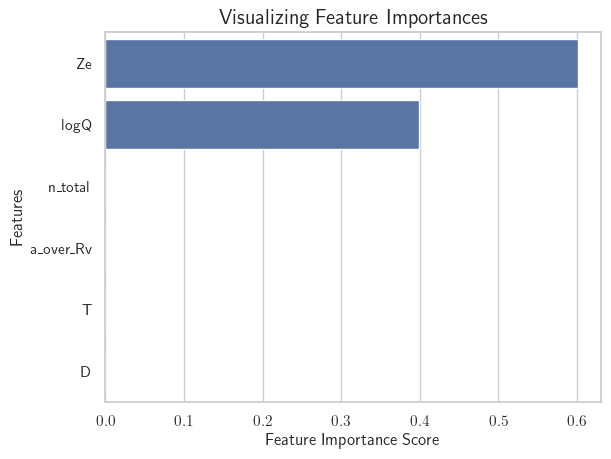

In [17]:
# ---- Create feature inputs for random forest ----
# We will train on the UNscaled data set, since we want to random forest to learn the relationships

# Get logQ (log10 of mass flux) and n_total (total water vapor mass fraction) from the scaled data set

if train_all_vars:
    # Setup input/output variables - the last three are tacked on for now but unlikely to be very important
    all_input_X = pd.concat([mc_df[['logQ','Ze']], mc_df_scaled[['n_total','a_over_Rv']], mc_df[['T','D']]], axis=1)
    X_train, X_test, Y_train, Y_test = train_test_split(all_input_X, averaged_data_set[output_vars], test_size=0.2, random_state=42)
    # Y_train = mc_df[output_vars]
    
    # For test data, we don't have the pre-built scaled data so need to quickly build a couple fields
    # logQ_test         = np.log10(mc_df_test['Q'])
    # n_total_test      = mc_df_test['n_0'] + mc_df_test['n_ec']
    # a_over_Rv         = mc_df_test['conduit_radius'] / extrapVentRadius(mc_df_test['Q']) # Normally randomized vent radius scaled to a standard vent radius
    # logQ_test.name, n_total_test.name, a_over_Rv.name    = 'logQ', 'a_over_Rv', 'n_total'
    
    # Build the test data frames
    # X_test = pd.concat([logQ_test, mc_df_test['Ze'], n_total_test, a_over_Rv, mc_df_test[['T','D']]],axis=1)
    # Y_test = mc_df_test[output_vars]
    
    # ---- Build classifier and train initial random forest ----
    rf_kwargs = {'n_estimators' : n_estimators,
             'max_depth' : 20,
             'bootstrap' : bootstrap, 
             'oob_score' : oob_score,
             'n_jobs' : n_jobs,
             'max_samples' : max_samples,
             # 'min_samples_split' : min_samples_split,
             # 'min_samples_leaf' : min_samples_leaf,
             'random_state' : 0,
             'verbose' : verbose,
                }
    regressor_rf = RandomForestRegressor(**rf_kwargs)

    regressor_rf.fit(X_train,Y_train)
    # Get scores and initial predictions
    regressor_rf.oob_score_
    
    # making the feature importances plot
    feature_imp = pd.Series(regressor_rf.feature_importances_, 
                            index=X_train.columns).sort_values(ascending=False)
    sns.barplot(x=feature_imp, y=feature_imp.index)
    plt.xlabel('Feature Importance Score', fontsize=12)
    plt.ylabel('Features', fontsize=12)
    plt.title("Visualizing Feature Importances", fontsize=15)

Not too surprisingly, only Ze and logQ register as important, the other variables are largely producing minor noise in this context

# Build Random Forest using only Ze and Q

In [14]:
# ---- Build classifier and train initial random forest ----
rf_kwargs = {'n_estimators' : n_estimators,
         'max_depth' : 20,
         'bootstrap' : bootstrap, 
         'oob_score' : oob_score,
         'n_jobs' : n_jobs,
         'max_samples' : max_samples,
         # 'min_samples_split' : min_samples_split,
         # 'min_samples_leaf' : min_samples_leaf,
         'random_state' : 0,
         'verbose' : verbose,
            }

regressor_rf = RandomForestRegressor(**rf_kwargs)



In [15]:
# ---- CHOOSE training, validation, test data ------

# It's useful to get a split of not just the key input vars, but also a couple other diagnostic vars:
#   e.g. collapse regime, non-dim Ze, etc
X_temp = pd.concat([mc_df[input_vars], mc_df_scaled[['Ze_over_Rv', 'clps_regime','Q']]], axis=1)

# New train/test set using only the 2 keys vars we care about
X_train, X_test, Y_train, Y_test = train_test_split(X_temp, averaged_data_set, test_size=0.2, random_state=42)

# Separate out training vars from housekeeping vars
X_train_extras = X_train[['Ze_over_Rv', 'clps_regime','Q']]
X_test_extras = X_test[['Ze_over_Rv', 'clps_regime','Q']]
X_train = X_train[input_vars]
X_test  = X_test[input_vars]

# Train the thing once
regressor_rf.fit(X_train,Y_train)

# Get scores and initial predictions
regressor_rf.oob_score_
predictions = regressor_rf.predict(X_test)

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    1.5s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    0.1s finished


In [60]:
# Put together test output and predicted output for easy plotting, in both scaled and unscaled formats

Y_predict = pd.DataFrame(data=predictions, columns=output_vars, index=X_test.index)
Y_test_predict = pd.concat([Y_test, Y_predict.rename(columns={col:col+'_pred' for col in df_predict.columns})], axis=1) # Combine test set and predictions

# Get prediction set scaled to physical constants for clear plots
# For test data, we don't have the pre-built scaled data so need to quickly build a couple fields
Y_test_scaled = rft.apply_physical_data_scaling(Y_test, Q_vec = 10**X_test['logQ'])
Y_predict_scaled = rft.apply_physical_data_scaling(Y_predict, Q_vec = 10**X_test['logQ'])
Y_predict_scaled[['Ze_over_Rv','logQ']] = pd.concat([X_test_extras['Ze_over_Rv'],X_test['logQ']], axis=1)

# Add in test data for comparison plots in seaborn, using the regular (unscaled) variable name
Y_test_predict_scaled = Y_predict_scaled.copy().rename(columns={col:col+'_pred' for col in scaled_output_vars})
Y_test_predict_scaled = pd.concat([Y_test_predict_scaled, Y_test_scaled[scaled_output_vars]], axis=1)

Y_test_predict_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6000 entries, 2308 to 29170
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   hm_over_Q14_pred  6000 non-null   float64
 1   rC_over_Rv_pred   6000 non-null   float64
 2   qw0_over_Q_pred   6000 non-null   float64
 3   qwC_over_Q_pred   6000 non-null   float64
 4   qs0_over_Q_pred   6000 non-null   float64
 5   qsC_over_Q_pred   6000 non-null   float64
 6   Ze_over_Rv        6000 non-null   float64
 7   logQ              6000 non-null   float64
 8   hm_over_Q14       6000 non-null   float64
 9   rC_over_Rv        6000 non-null   float64
 10  qw0_over_Q        6000 non-null   float64
 11  qwC_over_Q        6000 non-null   float64
 12  qs0_over_Q        6000 non-null   float64
 13  qsC_over_Q        6000 non-null   float64
dtypes: float64(14)
memory usage: 832.2 KB


### Random forest output 1
Show plume height, water, and particle fluxes (scaled) as a function of water depth for both test (ground truth) and predicted data

Text(0.5, 0.98, 'RF predictions plotted over test data (non-dimensionalized)')

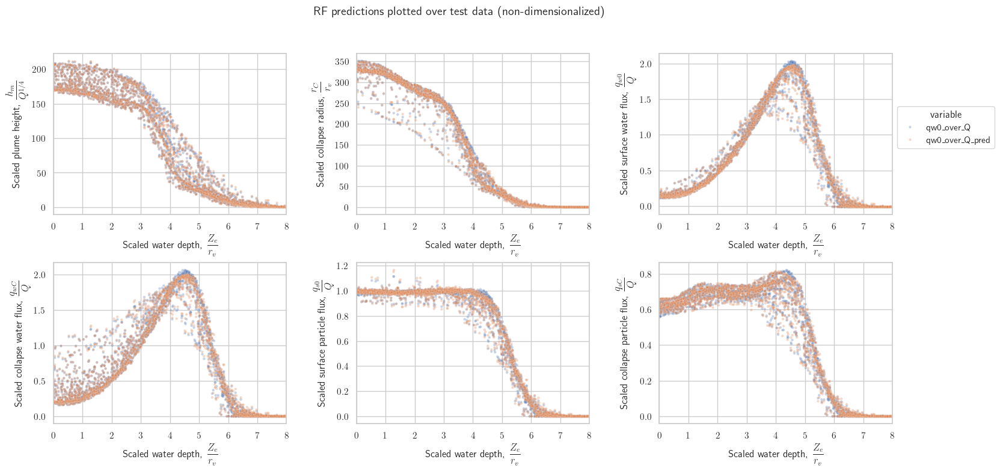

In [51]:
# Make a scaled data set to show test and validation data plotted over each


# df_test_predict_scaled = df_test_predict_scaled.assign(hm=mc_df_test['hm'] / mc_df_test['Q']**(1/4))
# df_test_predict_scaled = df_test_predict_scaled.assign(rC=mc_df_test['rC'] / extrapVentRadius(mc_df_test['Q']))
# df_test_predict_scaled = df_test_predict_scaled.assign(**{col: mc_df_test[col] / mc_df_test['Q'] for col in output_vars[2::]})

# Plot the comparison
fig,_ = rft.double_var_panels_scatter(Y_test_predict_scaled.sort_values('logQ',ascending=False),
                           x_var = 'Ze_over_Rv',
                           y_vars1 = scaled_output_vars,
                           y_vars2 = [var+'_pred' for var in scaled_output_vars],
                           # hue_var = '',
                           xlim = (0., 8.)
                          )
fig.suptitle('RF predictions plotted over test data (non-dimensionalized)')

### Random forest output 2
Plot predictions against test output and report error

In [61]:
Y_test_predict.info()
Y_test_predict[var]

<class 'pandas.core.frame.DataFrame'>
Index: 6000 entries, 2308 to 29170
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   hm        6000 non-null   float64
 1   rC        6000 non-null   float64
 2   qw0       6000 non-null   float64
 3   qwC       6000 non-null   float64
 4   qs0       6000 non-null   float64
 5   qsC       6000 non-null   float64
 6   hm_pred   6000 non-null   float64
 7   rC_pred   6000 non-null   float64
 8   qw0_pred  6000 non-null   float64
 9   qwC_pred  6000 non-null   float64
 10  qs0_pred  6000 non-null   float64
 11  qsC_pred  6000 non-null   float64
dtypes: float64(12)
memory usage: 738.4 KB


2308     3.587581e+06
22404   -1.067616e+05
23397   -2.823636e+04
25058   -3.301843e+04
2664    -1.273211e+06
             ...     
2210    -2.469070e+05
14144    3.960579e+06
23108   -3.576320e+05
25703   -2.244046e+05
29170   -4.847092e+04
Name: qw0, Length: 6000, dtype: float64

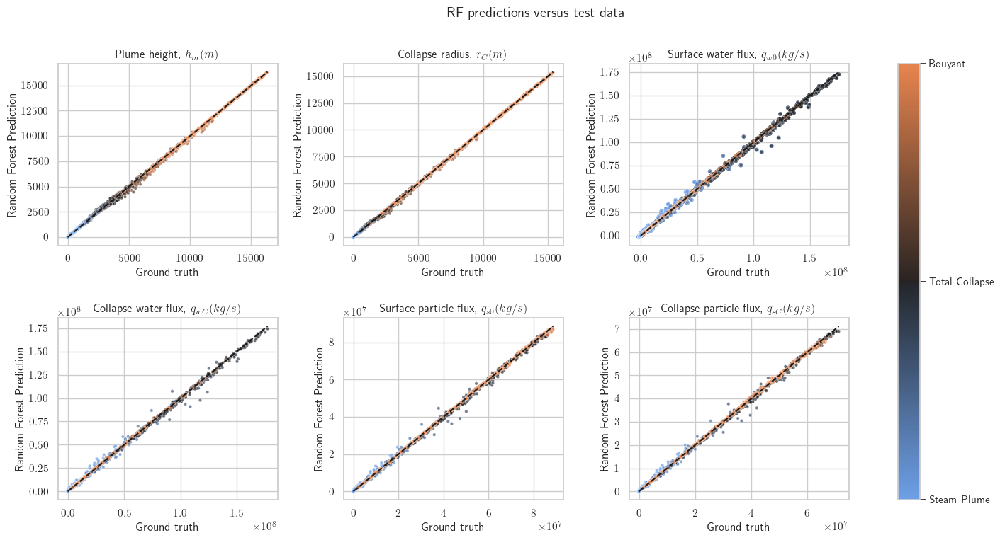

In [62]:
n_rows = 2
n_cols = ceil(len(scaled_output_vars)/n_rows)

fig,axes = plt.subplots(n_rows, n_cols, figsize=(18,8),gridspec_kw={'wspace':0.3, 'hspace':0.4})
fig.suptitle('RF predictions versus test data')
cmap = sns.diverging_palette(30, 250, l=65, center="dark", as_cmap=True)

for ax,var in zip(axes.flatten(),output_vars):
    if ax==axes[0,n_cols-1]:
        show_legend = True
        sc=ax.scatter(Y_test_predict[var], Y_test_predict[var+'_pred'],
                    c = X_test_extras['clps_regime'],
                    s=10, cmap = cmap)
        cbar = fig.colorbar(sc,ax=axes,ticks=[0,1,2]) #,label=var_labels['clps_regime'],)
        cbar.ax.set_yticklabels(['Bouyant','Total Collapse','Steam Plume'])
        cbar.ax.invert_yaxis()
    else:
        show_legend = False  
        
    # Plot predictions against test set ground truth
    x_max = Y_test_predict[[var, var+'_pred']].max(axis=None)
    ax.plot([0, x_max],[0, x_max],'--k')
    sns.scatterplot(data=Y_test_predict, 
                x=var,y=var+'_pred',
                hue=X_test_extras['clps_regime'],
                # hue=df_test_predict_scaled['logQ'],
                s=10,
                # sizes=3,
                alpha=0.7,
                palette=cmap, #"crest", 
                # edgecolors=[0, 0, 0],
                ax=ax, 
                legend=False) #"ch:r=-.2,d=.3_r") #, edgecolors=[0, 0, 0])
    ax.set_title(rft.var_labels[var])
    ax.set_xlabel('Ground truth')
    ax.set_ylabel('Random Forest Prediction')
    
    # if show_legend:
        # plt.colorbar(mc_df_test['clps_regime'],axes=ax)
        # sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))



plt.show()

# Evaluating initial performance
## Building and assessing error metrics
Defining prediction error for this data set is a bit tricky, because variables in the training and test sets each span many orders of magnitude, are *not* normally distributed, and are fairly skewed towards 0. So normalizing error by the mean, median, or iqr of the test data, for example, may be a bit misleading. Normalize each point by the magnitude of the test set doesn't also work since there are so many zeros.

Text(0.5, 0.98, 'Test data distributions : non-Gaussian and skewed towards 0')

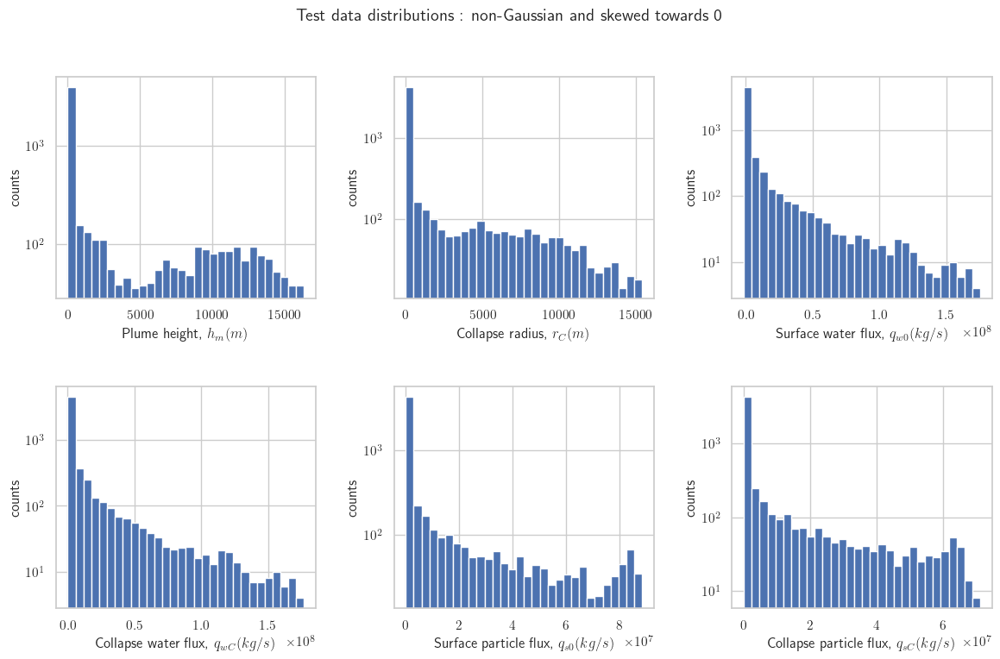

In [64]:
fig,axes = plt.subplots(2,3, figsize=(14,8),gridspec_kw={'wspace':0.3, 'hspace':0.4})
for ax,var in zip(axes.flatten(),output_vars):
    _ = ax.hist(Y_test[var],bins=30,log=True)
    ax.set_xlabel(rft.var_labels[var])
    ax.set_ylabel('counts')
fig.suptitle('Test data distributions : non-Gaussian and skewed towards 0')
    # _ = axes[1].hist(norm_error_raw['hm'],bins=30,log=True)
    # _ = axes[2].hist(norm_error['hm'],bins=30,log=True)

Given the above complications, I'm least bothered by normalizing by the data range as a standard measure, so that's built into the nrmse function used below.   

One more approach: Above, we used a local point cloud radius to produce "locally averaged" training and test sets to get a more smooth result. So we can use the different between the locally averaged and raw data sets as a reasonable error normalization, since it gives a measure of the spread of data *locally* as a function of Q and Ze.

If the prediction errors are substantially smaller than the scatter of the original (non-averaged) data, that's one good measure of effective predictions in this case.

Text(0.5, 0.98, 'Error distributions: (avg_test -  raw_test) vs (pred - avg_test)')

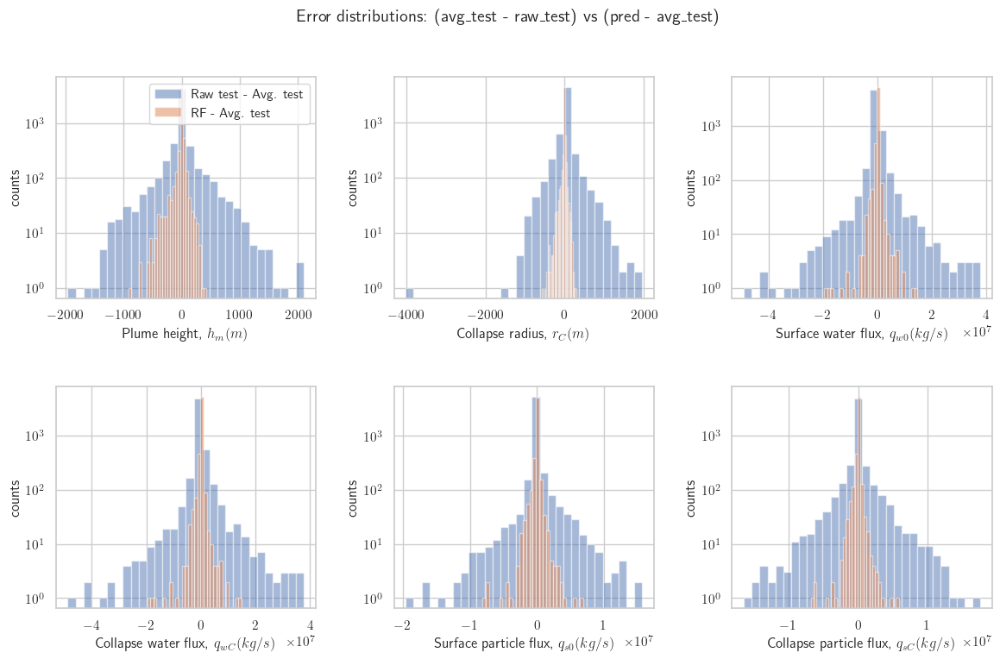

In [75]:

# Plot histograms of the prediction error for the SCALED/NON-DIMENSIONAL data
# fig,axes = plt.subplots(2,3, figsize=(14,8),gridspec_kw={'wspace':0.3, 'hspace':0.4})
# for ax,var in zip(axes.flatten(),scaled_output_vars):
#     _ = ax.hist(snorm_error[var],bins=30,log=True)
#     ax.set_xlabel(rft.var_labels[var])
#     ax.set_ylabel('counts')
# fig.suptitle('Error distributions: scaled_prediction - scaled_test')



# Compare local point cloud distribution from averaging step (in blue) with prediction error (in orange)
fig,axes = plt.subplots(2,3, figsize=(14,8),gridspec_kw={'wspace':0.3, 'hspace':0.4})
for ax,var in zip(axes.flatten(),output_vars):
    _ = ax.hist(norm_error_test[var],bins=30,log=True, histtype='barstacked',alpha=0.5)
    _ = ax.hist(norm_error[var],bins=30,log=True, histtype='barstacked',alpha=0.5)
    ax.set_xlabel(rft.var_labels[var])
    ax.set_ylabel('counts')
axes[0,0].legend(['Raw test - Avg. test','RF - Avg. test'])
fig.suptitle('Error distributions: (avg_test -  raw_test) vs (pred - avg_test)')




In [67]:
# pred_vars = [var+'_pred' for var in output_vars]
# y_pred = df_predict.rename(columns={pv: var for pv,var in zip(pred_vars,output_vars)})

# Get error estimate for point cloud averaged test set ground truth
rmse_test,nrmse_test,norm_error_test = rft.nrmse(Y_test,mc_df.loc[Y_test.index,output_vars])
std_error = norm_error_test.std(axis=0)

# Get error estimate for prediction set
rmse_raw,nrmse_raw,norm_error_raw = rft.nrmse(mc_df.loc[Y_predict.index,output_vars],Y_predict)

# Error between averaged and random forest sets -> ultimately the main interest
rmse,nrmse,norm_error = rft.nrmse(Y_test,Y_predict)
mse = mean_squared_error(Y_test[output_vars],Y_predict[output_vars],multioutput='raw_values')

srmse,snrmse,snorm_error = rft.nrmse(Y_test_scaled,Y_predict_scaled)
smse = mean_squared_error(Y_test_scaled[scaled_output_vars],Y_predict_scaled[scaled_output_vars],multioutput='raw_values')


std_rmse = rmse / std_error # Error standardized to raw point cloud spread

# Gather error metrics together for a quick comparison
all_rmse = pd.concat([nrmse_test, nrmse_raw, nrmse, std_rmse, pd.Series(smse,index = output_vars)],axis=1).transpose()
all_rmse.index = ['RMSE: raw_test_VS_avg_test', 'RMSE: raw_VS_pred', 'RMSE: avg_VS_pred', 'RMSE: pred / local_std','Scaled MSE']

# print(mse)
print(np.mean(std_rmse**2))
all_rmse


0.06556641087935372


,hm,rC,qw0,qwC,qs0,qsC
RMSE: raw_test_VS_avg_test,0.015673,0.013782,0.019370,0.019278,0.015762,0.024167
RMSE: raw_VS_pred,0.015357,0.012822,0.019832,0.019856,0.016320,0.020861
RMSE: avg_VS_pred,0.004400,0.003091,0.004939,0.004943,0.004762,0.004966
RMSE: pred / local_std,0.280722,0.224276,0.254945,0.256400,0.302212,0.205487
Scaled MSE,1.602611,4.194175,0.000390,0.000397,0.000101,0.000062


The above rows show the following for each prediction variable:
 1. Average RMS error between the raw data (pre-point-cloud averaging) and test data (post-point-cloud averaging) as a *minimum benchmark*.
 2. Average RMS error between the raw data and the predictions (not all that interesting per se, but we expect similar to the error in (1.)).
 3. Average Test vs prediction RMS error --> *the primary measure of error on the test data set*
 4. Prediction error (4.) divided by the standard deviation of raw error (1.) to give a *relative* error benchmark. Values much less than 1 show that the predictions are much better than the raw (non-averaged) data set. That shouldn't be surprising, but is a good benchmark.
 5. Mean squared error on predictions vs the test set. Noted here as it may be the metric we use in GridSearchCV

In [88]:
pd.concat(
    [norm_error,X_test_extras['clps_regime']],axis=1)

,hm,rC,qw0,qwC,qs0,qsC,Ze,logQ,clps_regime
2308,-107.163180,-67.129659,156061.923376,128285.910582,18572.927556,26036.629780,39.538347,6.520469,0.04
22404,0.001663,0.000000,-2624.987515,0.000000,0.000000,0.000000,191.382421,6.859135,2.00
23397,0.000000,0.000000,-78.968116,0.000000,0.000000,0.000000,181.845947,6.293920,2.00
25058,0.000000,0.000000,-445.835686,0.000000,0.000000,0.000000,246.271745,6.346612,2.00
2664,15.650514,0.023649,9916.899037,4075.408214,1496.174169,1281.919461,331.027675,7.918153,2.00
...,...,...,...,...,...,...,...,...,...
2210,0.696915,0.000000,-2297.424071,0.000000,0.000000,0.000000,223.637167,7.222073,2.00
14144,3.109364,3.968339,-73384.025331,-72706.150692,-56773.589941,-113846.507498,23.252536,7.333094,0.00
23108,0.000000,0.000000,7307.733598,0.000000,0.000000,0.000000,473.911334,7.363896,2.00
25703,0.000000,0.000000,-2210.506866,0.000000,0.000000,0.000000,465.555920,7.173545,2.00


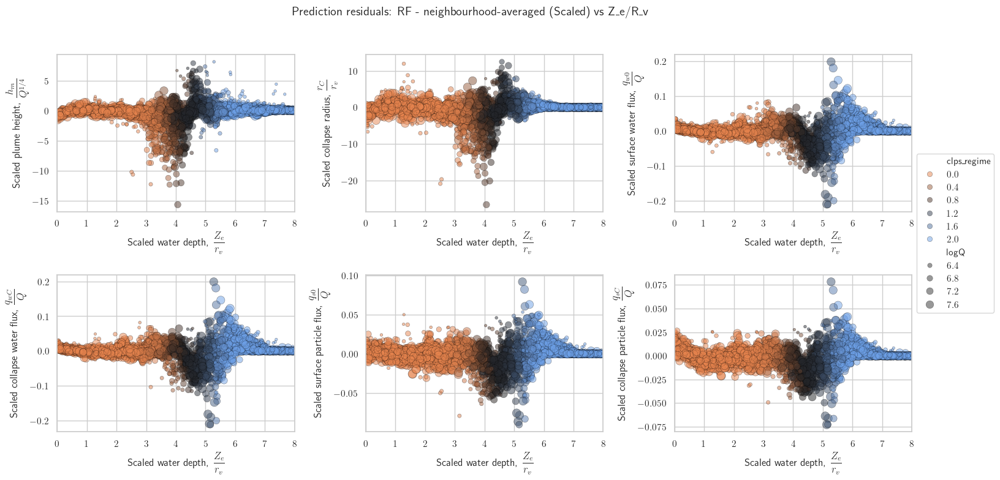

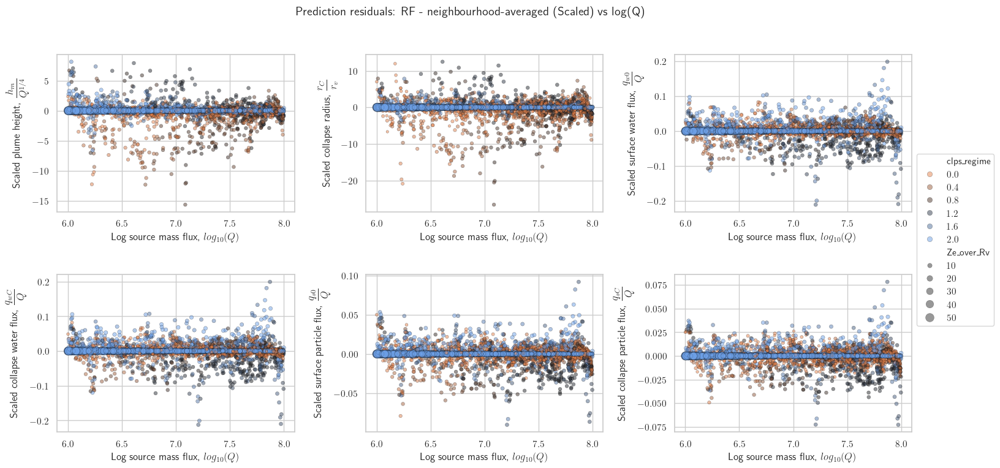

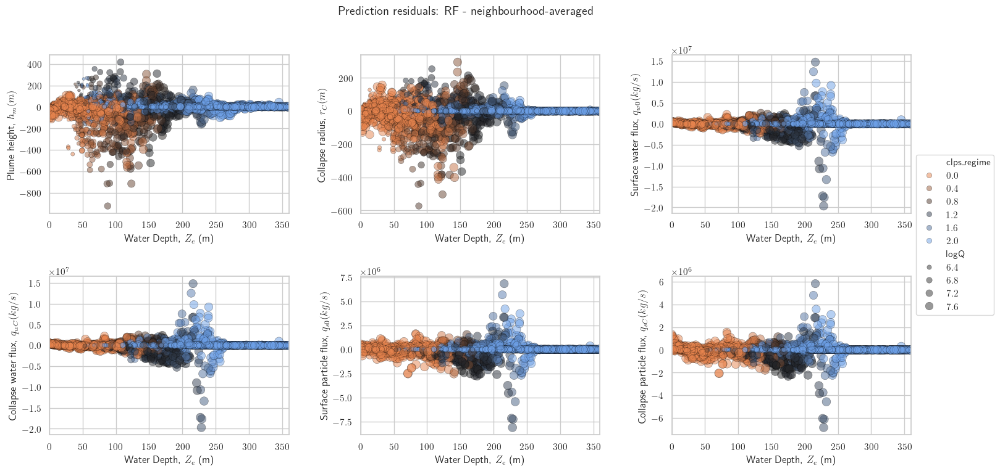

In [89]:
# Plot the residuals on predictions vs test set

snorm_error[scaled_input_vars] = Y_test_predict_scaled[scaled_input_vars]
norm_error[input_vars] = X_test

fig,axes = rft.single_var_panels_scatter(pd.concat(
    [snorm_error,X_test_extras['clps_regime']],axis=1),
                              # .sort_values('logQ',ascending=False),
                           x_var = 'Ze_over_Rv',
                           y_vars = scaled_output_vars,
                           hue_var = 'clps_regime',
                           size_var = 'logQ',
                           title = 'Prediction residuals: RF - neighbourhood-averaged (Scaled) vs Z_e/R_v',
                           xlim = (0., 8.)
                          )

fig,axes = rft.single_var_panels_scatter(pd.concat(
    [snorm_error,X_test_extras['clps_regime']],axis=1),
                              # .sort_values('logQ',ascending=False),
                           x_var = 'logQ',
                           y_vars = scaled_output_vars,
                           hue_var = 'clps_regime',
                           size_var = 'Ze_over_Rv',
                           title = 'Prediction residuals: RF - neighbourhood-averaged (Scaled) vs log(Q)',
                           # xlim = Ze_range_train
                          )

fig,axes = rft.single_var_panels_scatter(pd.concat(
    [norm_error,X_test_extras['clps_regime']],axis=1),
                              # .sort_values('logQ',ascending=False),
                           x_var = 'Ze',
                           y_vars = output_vars,
                           hue_var = 'clps_regime',
                           size_var = 'logQ',
                           title = 'Prediction residuals: RF - neighbourhood-averaged',
                           xlim = Ze_range_train
                          )




In [91]:
pd.concat([X_test,Y_test],axis=1)

,Ze,logQ,hm,rC,qw0,qwC,qs0,qsC
2308,39.538347,6.520469,7617.058424,3052.125521,3.587581e+06,4.622982e+06,3.241279e+06,2.158769e+06
22404,191.382421,6.859135,0.000000,0.000000,-1.067616e+05,0.000000e+00,0.000000e+00,0.000000e+00
23397,181.845947,6.293920,0.000000,0.000000,-2.823636e+04,0.000000e+00,0.000000e+00,0.000000e+00
25058,246.271745,6.346612,0.000000,0.000000,-3.301843e+04,0.000000e+00,0.000000e+00,0.000000e+00
2664,331.027675,7.918153,1.030931,0.000000,-1.273211e+06,0.000000e+00,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...,...
2210,223.637167,7.222073,0.000000,0.000000,-2.469070e+05,0.000000e+00,0.000000e+00,0.000000e+00
14144,23.252536,7.333094,11969.534234,8363.707791,3.960579e+06,6.532649e+06,2.124593e+07,1.392941e+07
23108,473.911334,7.363896,0.000000,0.000000,-3.576320e+05,0.000000e+00,0.000000e+00,0.000000e+00
25703,465.555920,7.173545,0.000000,0.000000,-2.244046e+05,0.000000e+00,0.000000e+00,0.000000e+00


## Run mock simulation tests with fixed mass flux Q, and varying water depth Ze, simulating the real use case
Run test query points along fixed Q, varying Ze from min to max. This is similar to how the random forest model will be queried with the glaciovolcano model

In [34]:
def sim_model_scenario(
        regressor: RandomForestRegressor,
        test_data: pd.DataFrame,
        Q: tuple                = np.log10((6e6, 4e7)), 
        Ze_max: tuple           = (50, 150),
        coord_ranges            = None,
        input_vars : list[str]  = ['Ze','logQ'],
        output_vars: list[str]  = ['hm','rC','qw0','qwC','qs0','qsC'],
        search_radius: float    = 0.05
        ):
    
    assert all([var in test_data.columns for var in input_vars]), \
        "Not all input variables were found in the data set"
    assert all([var in test_data.columns for var in output_vars]), \
        "Not all output variables were found in the data set"
    

    var_labels = {'Ze' : r'Water Depth, $\displaystyle{Z_e}$ (m)',
             'Q'   : r'Source mass flux, $\displaystyle{Q}$ (kg/s)',
             'logQ': r'Log source mass flux, $\displaystyle{log_{10}(Q)}$',
             'hm'  : r'Plume height, $\displaystyle{h_m} (m)$',
             'rC'  : r'Collapse radius, $\displaystyle{r_C} (m)$',
             'qw0' : r'Surface water flux, $\displaystyle{q_{w0}} (kg/s)$',
             'qwC' : r'Collapse water flux, $\displaystyle{q_{wC}} (kg/s)$',
             'qs0' : r'Surface particle flux, $\displaystyle{q_{s0}} (kg/s)$',
             'qsC' : r'Collapse particle flux, $\displaystyle{q_{sC}} (kg/s)$',
             'clps_regime': 'Collapse Regime',
             'Ze_over_Rv' : r'Scaled water depth, $\displaystyle\frac{Z_e}{r_v}$',
             'hm_over_Q14': r'Scaled plume height, $\displaystyle\frac{h_m}{Q^{1/4}}$',
             'rC_over_Rv' : r'Scaled collapse radius, $\displaystyle\frac{r_C}{r_v}$',
             'qw0_over_Q' : r'Scaled surface water flux, $\displaystyle\frac{q_{w0}}{Q}$',
             'qwC_over_Q' : r'Scaled collapse water flux, $\displaystyle\frac{q_{wC}}{Q}$',
             'qs0_over_Q' : r'Scaled surface particle flux, $\displaystyle\frac{q_{s0}}{Q}$',
             'qsC_over_Q' : r'Scaled collapse particle flux, $\displaystyle\frac{q_{sC}}{Q}$',
             }

    scaled_vars = {'Ze': 'Ze_over_Rv',
               'Q': 'logQ',
               'hm' : 'hm_over_Q14',
               'rC' : 'rC_over_Rv',
               'qw0' : 'qw0_over_Q',
               'qwC' : 'qwC_over_Q',
               'qs0' : 'qs0_over_Q',
               'qsC' : 'qsC_over_Q',              
               }

    # Use a simple exponential function to make a proxy water depth evolution
    # over an arbitrary timescale
    nn = 201
    tau = 1.5
    t = np.linspace(0,10,nn) # Build a dummy time vector
    y = t * np.exp(1 - t/tau)
    
    # Make base array of Ze(t)
    ze_label = [f'Ze_{ze}' for ze in Ze_max]
    
    # Get scaled coordinate points
    coordinate_points = rft.get_scaled_coordinates(test_data[input_vars], coord_ranges)


    # -- Make a big tiled array of simulation outputs and plot each variable --
    num_q = len(Q)
    num_ze = len(Ze_max)
    num_vars = 10
    big_array_size = (nn*num_q,num_vars)
    control_vars = ['t','Ze','Ze_max','logQ'] 
    big_array_columns = control_vars + output_vars
    nmse = np.zeros((num_q*num_ze, len(output_vars)))
    
    # Figure setup
    n_cols = len(Ze_max)
    n_rows = len(output_vars)+1
    figsize = (6*num_ze+2,2*(len(output_vars)+1))
    sns.set_theme(style="whitegrid")
    fig,axes = plt.subplots(n_rows, n_cols, figsize=figsize,
                            gridspec_kw={'wspace':0.25, 'hspace':0.04})
    plt.rcParams['text.usetex'] = True

    # Loop over test Ze and Q vectors
    for zi,ze in enumerate(Ze_max):
        big_array = np.zeros(big_array_size)
        Ze_vector = ze * y
        query_dict = {}
        
        for qi,q in enumerate(Q):
            # Get prediction inputs
            x_predict = pd.DataFrame(
                data=np.column_stack((t, Ze_vector, np.full_like(y,ze), np.full_like(y,q))),
                columns=control_vars)
            # Get prediction outputs
            y_predict = regressor.predict(x_predict[input_vars])
            iloc1, iloc2 = qi*(nn),(qi+1)*nn
            big_array[iloc1:iloc2, :] = np.concatenate((x_predict,y_predict),axis=1)
    
            # Get training/test data query
            query_points = rft.get_scaled_coordinates(
                pd.DataFrame(np.column_stack((Ze_vector, np.full_like(Ze_vector, q))), 
                             columns=['Ze','logQ']),
                coord_ranges
                )
            
            # query_points = np.column_stack( ( scale_to_range(Ze_vector, Ze_range ), # Ze
            #                              scale_to_range(np.full_like(Ze_vector, q), Q_range)) ) # Q

            # Get the point neighbourhood for each query point
            _, query_dict[str(q)] = rft.average_points_within_radius(
                coordinate_points, test_data[output_vars], query_points,
                vector_coords=t, radius=search_radius, return_all=True)
            
            # Add Q labels for plotting
            query_dict[str(q)]=query_dict[str(q)].assign(logQ=np.full((query_dict[str(q)].shape[0],1), q))
            
            # sns.lineplot(x='x',y=var,data=all_values,errorbar='sd', ax=ax)
            
            
        query_df = pd.concat(query_dict,axis=0)
        simulation_df = pd.DataFrame(data=big_array, columns=big_array_columns)
    
        # First plot the made-up Ze time series
        sns.lineplot(x=t,y=Ze_vector,ax=axes[0,zi])
        axes[0,zi].set_ylabel(var_labels['Ze'])
        axes[0,zi].set_title(f'$\displaystyle Z_{{e,MAX}} = {ze}$ m')
        
        # Then loop over output variable to plot each
        for vi,var in enumerate(output_vars):  
            # First plot the training/test set query
            # for qi,q in enumerate(Q):
            if vi != 0 or zi != 0:
                show_legend = False
            else:
                show_legend = True

            simp=sns.lineplot(data=query_df,
                         x='x',
                         y=var,
                         hue='logQ',
                         errorbar='sd', 
                         palette=sns.color_palette("Greys", n_colors=num_q),
                         ax=axes[vi+1,zi],
                         legend=show_legend)
                         # label=f'Trainig avg., r = {search_radius}')
            rfp=sns.lineplot(data=simulation_df,
                         x='t',
                         y=var,
                         hue = 'logQ',
                         palette=sns.color_palette("Blues", n_colors=num_q),
                         ax=axes[vi+1,zi],
                         legend=show_legend)
            
            if show_legend:
                lh = simp.get_legend_handles_labels()
                lh[1][0:num_q] = ['Train : ' + lab for lab in lh[1][0:num_q]]
                lh[1][num_q:-1] = ['RF : ' + lab for lab in lh[1][num_q:-1]]
                rfp.legend(lh[0],lh[1], title=var_labels['logQ'],loc='right')
            
    return None #nmse

<>:122: SyntaxWarning: invalid escape sequence '\d'
<>:122: SyntaxWarning: invalid escape sequence '\d'
/var/folders/_b/0nl9fz2d7f3fgjfpytd5qx180000gn/T/ipykernel_75794/3840137356.py:122: SyntaxWarning: invalid escape sequence '\d'
  axes[0,zi].set_title(f'$\displaystyle Z_{{e,MAX}} = {ze}$ m')


# Simulating the usage case
The trained Random Forest will run internally in an ODE solver, so we want the output to be both accurate relative to the original model we are emulating, and relatively smooth to enable solver convergence. Here we generate a simulated usage case scenario where the RF predicts outputs for simulated time series of mass flux and water depth, and test error and roughness metrics.

We'll use those metrics below in the grid search to help optimize the final model.

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 192 tasks      |

Normalized error matrix: 
          hm        rC       qw0       qwC       qs0       qsC
0  0.014350  0.019920  0.069923  0.046629  0.008525  0.011699
1  0.002057  0.003886  0.029518  0.022196  0.004904  0.004402
2  0.014906  0.021052  0.087479  0.059503  0.012523  0.017636
3  0.007570  0.008876  0.024452  0.021592  0.007868  0.007461
Normalized roughness difference matrix: 
          hm        rC       qw0       qwC       qs0       qsC
0  0.087458  0.048037  0.009454  0.004115  0.071885 -0.156402
1  0.002191  0.019685  0.023699  0.023829 -5.284943 -0.084209
2  0.118151  0.105676  1.342761  1.296013  0.207259  0.284382
3  0.129447  0.104523  0.206274  0.208007  0.051306  0.087200
Mean error:  0.022038537464251634
Mean roughness diff:  -0.0455917646426646


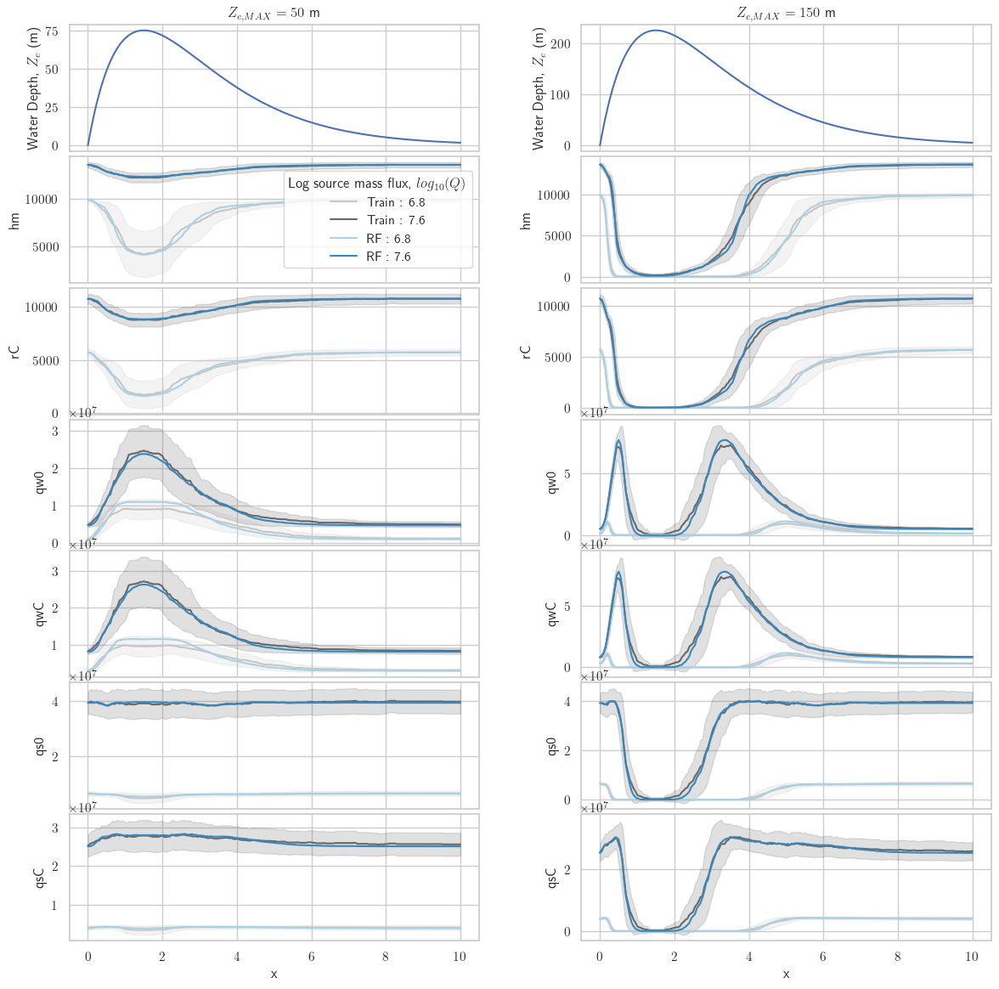

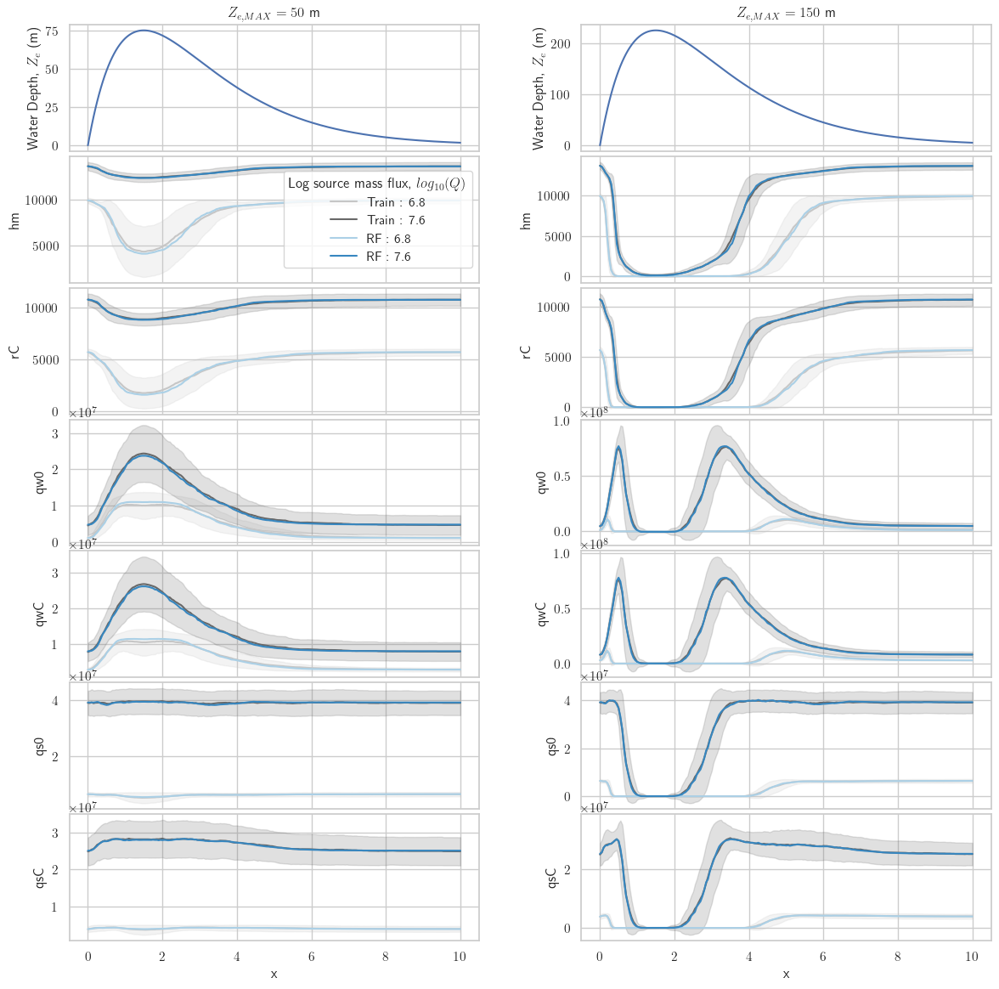

In [93]:
# Simulation parameters testing a hypothetical usage case for the random forest predictons

Q_vector = [6e6, 4e7] # Q, kg/s - Span about an order of magnitude in mass flux for testing
Ze_max = [50, 150] #, 180] # sample MAX water depth occurring in each simulation
# search_radius = 0.07

# rft.simulate_model_scenario(
# sim_model_scenario(regressor_rf, mc_df_test[input_vars + output_vars],
#                             Q = np.round(np.log10(Q_vector),decimals=1),
#                             Ze_max = Ze_max,
#                             coord_ranges = {'Ze': Ze_range, 'logQ': Q_range},
#                             search_radius = search_radius
#                            )

# Run a simulated use case and test for error and output smoothness relative to test data
# --> Run once on the test set
normalized_mean_error, normalized_roughness_difference = rft.simulate_model_scenario(
                            regressor_rf, 
                            pd.concat([X_test,Y_test],axis=1),
                            Q = np.round(np.log10(Q_vector),decimals=1),
                            Ze_max = Ze_max,
                            coord_ranges = {'Ze': Ze_range, 'logQ': Q_range},
                            search_radius = search_radius
                           )

# Run a simulated use case and test for error and output smoothness relative to test data
# --> Run again on the FULL set (this gives us better point-queries for generating the simulated data)
normalized_mean_error, normalized_roughness_difference = rft.simulate_model_scenario(
                            regressor_rf, 
                            mc_df[input_vars + output_vars],
                            Q = np.round(np.log10(Q_vector),decimals=1),
                            Ze_max = Ze_max,
                            coord_ranges = {'Ze': Ze_range, 'logQ': Q_range},
                            search_radius = search_radius
                           )

print('Normalized error matrix: \n',normalized_mean_error)
print('Normalized roughness difference matrix: \n',normalized_roughness_difference)
print('Mean error: ',normalized_mean_error.mean(axis=None))
print('Mean roughness diff: ',normalized_roughness_difference.mean(axis=None))

# Grid Search Cross-Validation to optimize the RF

In [39]:
grid_search = GridSearchCV(estimator=regressor_rf,
                           param_grid=param_grid,
                           n_jobs = 4,
                           return_train_score=True,
                           verbose = 2)
grid_search.fit(X_train,Y_train)
results = pd.DataFrame(grid_search.cv_results_)

results

Fitting 5 folds for each of 12 candidates, totalling 60 fits


KeyboardInterrupt: 

# Trying out a simple SVM
This is a quick test on the output of a support vector regressor to see how it compares. The Random Forest result is generally much better.

In [120]:
# --------- TRY A SIMPLE SVM -------------
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import minmax_scale


mmb = ['hm']
coord_ranges = {'Ze': Ze_range_train, 'logQ': Q_range}
search_radius = 0.05
    
# Quick test vector build
q = np.log10(Q_vector[1])
Zz = Ze_max[1]
nn = 201
tau = 1.5
t = np.linspace(0,10,nn) # Build a dummy time vector
y = t * np.exp(1 - t/tau)
Ze_vector = Zz * y

# Get simulated test data
coordinate_points = rft.get_scaled_coordinates(mc_df_test[input_vars], coord_ranges)
query_points = rft.get_scaled_coordinates(
    pd.DataFrame(np.column_stack((Ze_vector, np.full_like(Ze_vector, q))), 
                  columns=['Ze','logQ']),
    coord_ranges
    )
# Get the point neighbourhood for each query point
query_avg, _ = rft.average_points_within_radius(
    coordinate_points, mc_df_test[mmb], query_points,
    vector_coords=t, radius=search_radius, return_all=True)

# Get scaled training data points
X_train_scaled = rft.get_scaled_coordinates(X_train,coord_ranges)
this_y = Y_train[mmb]



# Train the thing
svr_rbf = SVR(kernel="rbf", C=200, gamma="scale", epsilon=0.02)
svr_rbf = svr_rbf.fit(X_train_scaled,np.array(this_y).squeeze())


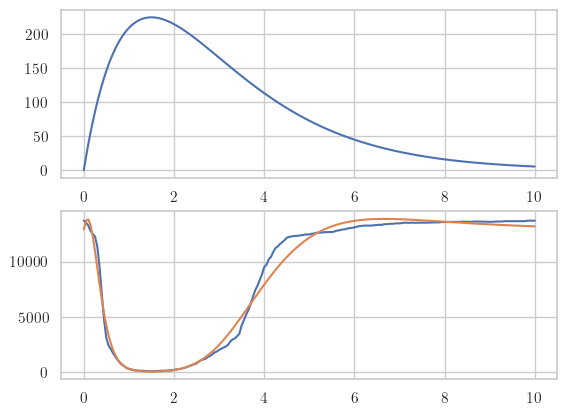

In [121]:

fig,axes = plt.subplots(2,1)
axes[0].plot(t,Ze_vector)
axes[1].plot(t,query_avg[mmb])
axes[1].plot(t,svr_rbf.predict(query_points))
